# Group Assignment 3: Cleaning up the Notebook - Monica and Bailey

## Research Question

* Is there a correlation between neighborhood income, race, and access to bike infrastructure?
* If so, does this impacts the number of bike collisions in the city of Los Angeles (LA)? 

## Importing data and libraries

We first import the appropriate libraries to the notebook.

Then we pull US Census's 2019 American Community Survey data from Census Reporter. The two GEOJSON files contain every census tracts in the City of Los Angeles with the variable of median household income and race. We drop row 1004 because the data is an average for the entire city and not its own census tract.
- Source link for Median Household Income: https://censusreporter.org/data/table/?table=B02001&geo_ids=16000US0644000,140|16000US0644000&primary_geo_id=16000US0644000)
- Source link for Race: https://censusreporter.org/data/table/?table=B02001&geo_ids=16000US0644000&primary_geo_id=16000US0644000

We will also be using the the City of Los Angeles’s geospatial data of existing bike lanes, last updated in November 2021. 
- Source link: https://geohub.lacity.org/datasets/ladot::city-of-los-angeles-bikeways-1/about

Lastly we will be using the traffic collision data from 2010 to the present (January 2022) as documented by the LAPD. 
- Source link: https://data.lacity.org/Public-Safety/Traffic-Collision-Data-from-2010-to-Present/d5tf-ez2w

In [1]:
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
from geopandas import GeoDataFrame
from shapely.geometry import Point

In [3]:
# making dataframe 
df = pd.read_csv("BikeAccidents.csv") 

In [4]:
mhi = gpd.read_file('acs2019_5yr_B19013_14000US06037222001.geojson')

In [5]:
bwy = gpd.read_file('City_of_Los_Angeles_Bikeways.geojson')

In [6]:
census = gpd.read_file('acs2019_5yr_B03002_14000US06037222001.geojson')

In [7]:
df = pd.read_csv("BikeAccidents.csv") 

Let's sample the data to make sure it loads properly.

In [8]:
mhi.sample(10)

,geoid,name,B19013001,"B19013001, Error",geometry
335,14000US06037141303,"Census Tract 1413.03, Los Angeles, CA",82448.0,13051.0,"MULTIPOLYGON (((-118.45743 34.15840, -118.4562..."
706,14000US06037227010,"Census Tract 2270.10, Los Angeles, CA",48200.0,8255.0,"MULTIPOLYGON (((-118.25427 34.02038, -118.2541..."
788,14000US06037239330,"Census Tract 2393.30, Los Angeles, CA",32708.0,6561.0,"MULTIPOLYGON (((-118.26955 33.98244, -118.2683..."
772,14000US06037237500,"Census Tract 2375, Los Angeles, CA",32051.0,5414.0,"MULTIPOLYGON (((-118.29155 33.97982, -118.2915..."
831,14000US06037262303,"Census Tract 2623.03, Los Angeles, CA",250001.0,NaN,"MULTIPOLYGON (((-118.49599 34.07105, -118.4959..."
732,14000US06037231600,"Census Tract 2316, Los Angeles, CA",45123.0,3312.0,"MULTIPOLYGON (((-118.30455 34.00608, -118.3045..."
162,14000US06037122000,"Census Tract 1220, Los Angeles, CA",75486.0,16506.0,"MULTIPOLYGON (((-118.42716 34.20502, -118.4271..."
20,14000US06037104203,"Census Tract 1042.03, Los Angeles, CA",49609.0,11898.0,"MULTIPOLYGON (((-118.41799 34.27964, -118.4170..."
731,14000US06037231500,"Census Tract 2315, Los Angeles, CA",48912.0,15253.0,"MULTIPOLYGON (((-118.31711 34.01070, -118.3170..."
513,14000US06037203720,"Census Tract 2037.20, Los Angeles, CA",37917.0,8574.0,"MULTIPOLYGON (((-118.20721 34.04770, -118.2067..."


In [9]:
mhi.tail(5)

,geoid,name,B19013001,"B19013001, Error",geometry
1000,14000US06037980026,"Census Tract 9800.26, Los Angeles, CA",NaN,NaN,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
1001,14000US06037980028,"Census Tract 9800.28, Los Angeles, CA",NaN,NaN,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",NaN,NaN,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
1003,14000US06037990200,"Census Tract 9902, Los Angeles, CA",NaN,NaN,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
1004,16000US0644000,"Los Angeles, CA",62142.0,452.0,"MULTIPOLYGON (((-118.66818 34.18987, -118.6681..."


In [10]:
mhi = mhi.drop([1004])
mhi.tail(5)

,geoid,name,B19013001,"B19013001, Error",geometry
999,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",150250.0,13582.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
1000,14000US06037980026,"Census Tract 9800.26, Los Angeles, CA",NaN,NaN,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
1001,14000US06037980028,"Census Tract 9800.28, Los Angeles, CA",NaN,NaN,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",NaN,NaN,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
1003,14000US06037990200,"Census Tract 9902, Los Angeles, CA",NaN,NaN,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


In [11]:
bwy.sample(10)

,OBJECTID_12,SECT_ID,STREET_DES,OTHER,STR_FROM,STR_TO,ST_TYPE,WIDTH_,CL_Miles,Lane_Miles,...,Comments,Tag,Level_Protection,Level_ProtectionNotes,Level_Protetion2,Project_Name,Year_,Shape__Length,GlobalID,geometry
6227,6413,2491700,Collector,,CAMELLIA AVE,BECK AVE,,0.0,0.066325,0.132651,...,,6390.0,0.0,None,0,NOHO METRO BIKE SHARE,2019.0,350.198040,29f9da60-5268-4f8e-a6ea-48211da06a2f,"LINESTRING Z (-118.38226 34.17579 0.00000, -11..."
6039,6222,5591700,,,CURTIS AVE,NATIONAL BLVD,,0.0,0.051112,0.051112,...,,6212.0,0.0,None,0,None,2005.0,269.872207,d9344bbb-898a-45cf-bf89-fc315ec50a6b,"LINESTRING Z (-118.38762 34.02991 0.00000, -11..."
5601,5749,1876400,Secondary Highway,N RDWY,WISCONSIN ST,CATALINA ST,Select,40.0,0.076982,0.076982,...,,5720.0,0.0,None,0,None,2011.0,406.466010,eb4dfd2c-1632-43ba-a8d0-d0fd504cf277,"LINESTRING Z (-118.29308 34.01836 0.00000, -11..."
3469,3548,6012800,Local Street,,SYCAMORE AV,LA BREA AV,Select,40.0,0.073189,0.146377,...,,3369.0,0.0,None,0,None,2013.0,386.435361,393c11e9-44d7-4069-9f89-b7d14cc2fa05,"LINESTRING Z (-118.34279 34.08708 0.00000, -11..."
2582,2632,5580600,Secondary Highway,,BERENDO ST,CATALINA ST,Select,56.0,0.054511,0.109023,...,,2530.0,0.0,None,0,None,2005.0,287.819844,c8dcede7-7909-4f45-9604-2a5c73125f81,"LINESTRING Z (-118.29341 34.04423 0.00000, -11..."
3459,3538,6503500,Collector Street,,OLMSTED AV,CHERRYWOOD AV,Select,36.0,0.056626,0.113251,...,,3359.0,0.0,None,0,None,2005.0,298.983240,92797aa8-6eef-48a8-95f6-cb3028d89061,"LINESTRING Z (-118.32810 34.01461 0.00000, -11..."
1543,1581,2791700,Local Street,,ANAHEIM ST,G ST,Local,56.0,0.100169,0.200338,...,,1570.0,0.0,None,0,None,2013.0,528.892238,902386a3-dc5f-40ed-a0b8-ab0cd4ce13bd,"LINESTRING Z (-118.26623 33.77832 0.00000, -11..."
215,222,5065800,Scenic Collector Street,,CORONEL ST,CHAVEZ RAVINE PL,Select,40.0,0.064091,0.128181,...,,748.0,0.0,None,0,None,2013.0,338.398608,3c18caed-d794-4827-9654-eb397a1060f6,"LINESTRING Z (-118.24112 34.06722 0.00000, -11..."
5224,5348,2710000,Secondary Highway,,TURQUOISE ST,TOURMALINE ST,Select,55.0,0.066747,0.066747,...,,5329.0,0.0,None,0,None,2012.0,352.425371,3a83d901-0268-4680-81f3-b187a99ae75e,"LINESTRING Z (-118.19253 34.07927 0.00000, -11..."
5635,5783,4274100,Major Highway - Class II,E RDWY,SANDPIPER ST,WORLD WAY WEST,Select,40.0,0.581070,0.581070,...,,5763.0,0.0,None,0,None,2006.0,3068.051270,aba5260e-b035-48f1-a07f-38a14a09e97c,"LINESTRING Z (-118.43837 33.95040 0.00000, -11..."


In [12]:
bwy.tail(5)

,OBJECTID_12,SECT_ID,STREET_DES,OTHER,STR_FROM,STR_TO,ST_TYPE,WIDTH_,CL_Miles,Lane_Miles,...,Comments,Tag,Level_Protection,Level_ProtectionNotes,Level_Protetion2,Project_Name,Year_,Shape__Length,GlobalID,geometry
6768,7029,5473700,Scenic Major Highway - Class II,,KITTRIDGE ST,HAMLIN ST,Select,80.0,0.054003,0.108005,...,,3731.0,0.0,None,0,Resurfacing 22/22,2021.0,285.133785,e28e5ccc-b4f3-48bb-86a2-3d9b519d4747,"LINESTRING Z (-118.65577 34.18967 0.00000, -11..."
6769,7030,5473900,Scenic Major Highway - Class II,,VALLEY CIRCLE TE,VICTORY BL,Select,80.0,0.063629,0.127259,...,,3831.0,0.0,None,0,Resurfacing 22/22,2021.0,335.962447,d6c97ab3-40b7-4866-a377-486c00a667c4,"LINESTRING Z (-118.65573 34.18557 0.00000, -11..."
6770,7031,5473700,Scenic Major Highway - Class II,,KITTRIDGE ST,HAMLIN ST,Select,80.0,0.112990,0.225980,...,,4990.0,0.0,None,0,Resurfacing 22/22,2021.0,596.587646,3708bbb8-d6c5-4867-aaae-f7dba8793820,"LINESTRING Z (-118.65536 34.18809 0.00000, -11..."
6771,7032,5473900,Scenic Major Highway - Class II,,VALLEY CIRCLE TE,VICTORY BL,Select,80.0,0.062978,0.125956,...,,4991.0,0.0,None,0,Resurfacing 22/22,2021.0,332.524100,fa75a078-e085-426f-87bd-2941652df1f5,"LINESTRING Z (-118.65585 34.18466 0.00000, -11..."
6772,7033,5473500,Scenic Major Highway - Class II,,VANOWEN ST,WELBY WAY,Select,0.0,0.061742,0.061742,...,Not Installed Westside of St/Out of City Limit,6297.0,0.0,None,0,Resurfacing 22/22,2021.0,325.995785,56c8b078-f1aa-4c83-9ab7-e8aeb774a6ca,"LINESTRING Z (-118.65693 34.19411 0.00000, -11..."


In [13]:
census.sample(5)

,geoid,name,B03002001,"B03002001, Error",B03002002,"B03002002, Error",B03002003,"B03002003, Error",B03002004,"B03002004, Error",...,"B03002017, Error",B03002018,"B03002018, Error",B03002019,"B03002019, Error",B03002020,"B03002020, Error",B03002021,"B03002021, Error",geometry
490,14000US06037199400,"Census Tract 1994, Los Angeles, CA",4759.0,370.0,1407.0,303.0,184.0,87.0,210.0,157.0,...,12.0,1828.0,440.0,203.0,198.0,13.0,22.0,190.0,197.0,"MULTIPOLYGON (((-118.21481 34.07928, -118.2145..."
177,14000US06037123301,"Census Tract 1233.01, Los Angeles, CA",4530.0,383.0,2899.0,309.0,1368.0,306.0,210.0,149.0,...,12.0,449.0,226.0,225.0,252.0,0.0,12.0,225.0,252.0,"MULTIPOLYGON (((-118.40586 34.20643, -118.4054..."
109,14000US06037115302,"Census Tract 1153.02, Los Angeles, CA",3957.0,261.0,1166.0,160.0,524.0,152.0,224.0,80.0,...,12.0,1153.0,309.0,71.0,65.0,10.0,12.0,61.0,63.0,"MULTIPOLYGON (((-118.55357 34.23234, -118.5493..."
493,14000US06037199900,"Census Tract 1999, Los Angeles, CA",2692.0,290.0,474.0,131.0,51.0,31.0,42.0,54.0,...,12.0,1500.0,315.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.21586 34.06339, -118.2155..."
977,14000US06037297000,"Census Tract 2970, Los Angeles, CA",5597.0,532.0,3522.0,374.0,2626.0,292.0,269.0,221.0,...,17.0,630.0,473.0,204.0,195.0,66.0,105.0,138.0,175.0,"MULTIPOLYGON (((-118.32037 33.73577, -118.3199..."


In [14]:
census.tail(5)
# drop the 1004 row which is of the entire city of LA
# census = census.drop([1004])

,geoid,name,B03002001,"B03002001, Error",B03002002,"B03002002, Error",B03002003,"B03002003, Error",B03002004,"B03002004, Error",...,"B03002017, Error",B03002018,"B03002018, Error",B03002019,"B03002019, Error",B03002020,"B03002020, Error",B03002021,"B03002021, Error",geometry
999,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,75.0,169.0,73.0,136.0,72.0,16.0,17.0,...,12.0,14.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
1000,14000US06037980026,"Census Tract 9800.26, Los Angeles, CA",26.0,18.0,19.0,18.0,7.0,10.0,11.0,11.0,...,12.0,4.0,8.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
1001,14000US06037980028,"Census Tract 9800.28, Los Angeles, CA",0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,178.0,788.0,161.0,393.0,108.0,232.0,97.0,...,12.0,73.0,34.0,32.0,34.0,27.0,34.0,5.0,7.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
1003,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


In [15]:
census.tail(5)

,geoid,name,B03002001,"B03002001, Error",B03002002,"B03002002, Error",B03002003,"B03002003, Error",B03002004,"B03002004, Error",...,"B03002017, Error",B03002018,"B03002018, Error",B03002019,"B03002019, Error",B03002020,"B03002020, Error",B03002021,"B03002021, Error",geometry
999,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,75.0,169.0,73.0,136.0,72.0,16.0,17.0,...,12.0,14.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
1000,14000US06037980026,"Census Tract 9800.26, Los Angeles, CA",26.0,18.0,19.0,18.0,7.0,10.0,11.0,11.0,...,12.0,4.0,8.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
1001,14000US06037980028,"Census Tract 9800.28, Los Angeles, CA",0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,178.0,788.0,161.0,393.0,108.0,232.0,97.0,...,12.0,73.0,34.0,32.0,34.0,27.0,34.0,5.0,7.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
1003,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


In [16]:
df.sample(5)

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO_Codes,...,Victim Sex,Victim_Descent,Premise Code,Premise Description,Address,Cross Street,Lat,Long,Latitude,Longitude
7768,190808626,4/17/19,4/17/19,1825,8,West LA,807,997,TRAFFIC COLLISION,Veh vs Bike,...,F,White,101.0,STREET,BEVERLY GLEN BL,BEVERLY GLEN CI,34.1268,-118.4444,34.1268,-118.4444
3814,150626789,12/26/15,12/26/15,1605,6,Hollywood,637,997,TRAFFIC COLLISION,Veh vs Bike,...,M,White,101.0,STREET,HOLLYWOOD BL,GOWER ST,34.1017,-118.3224,34.1017,-118.3224
8683,181322891,11/16/18,11/16/18,1130,13,Newton,1325,997,TRAFFIC COLLISION,Bike vs Veh,...,M,Other,101.0,STREET,CENTRAL AV,29TH ST,34.0157,-118.2562,34.0157,-118.2562
5272,161421234,8/13/16,8/12/16,2120,14,Pacific,1435,997,TRAFFIC COLLISION,Veh vs Bike,...,M,White,101.0,STREET,VENICE,GRAND VIEW,34.0049,-118.4312,34.0049,-118.4312
4571,152108073,4/1/15,4/1/15,1110,21,Topanga,2141,997,TRAFFIC COLLISION,Veh vs Bike,...,M,White,101.0,STREET,PLATT AV,VICTORY BL,34.1898,-118.6426,34.1898,-118.6426


## Initial bar graph of Median Household Income by Census Tract

Let's create a histogram of MHI by census tract to see the distribution across the city. Let's first clean the data columns though.

In [17]:
list(mhi)

['geoid', 'name', 'B19013001', 'B19013001, Error', 'geometry']

In [18]:
columns_to_keep = ['geoid', 'name', 'B19013001', 'geometry']

In [19]:
mhi = mhi[columns_to_keep]

In [20]:
mhi.columns = ['geoid', 'name', 'MHI', 'geometry']

In [21]:
mhi.head()

,geoid,name,MHI,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


Now let's plot the histogram!

<AxesSubplot:title={'center':'City of Los Angeles Census Tracts by \n Median Household Income (USD)'}, ylabel='Frequency'>

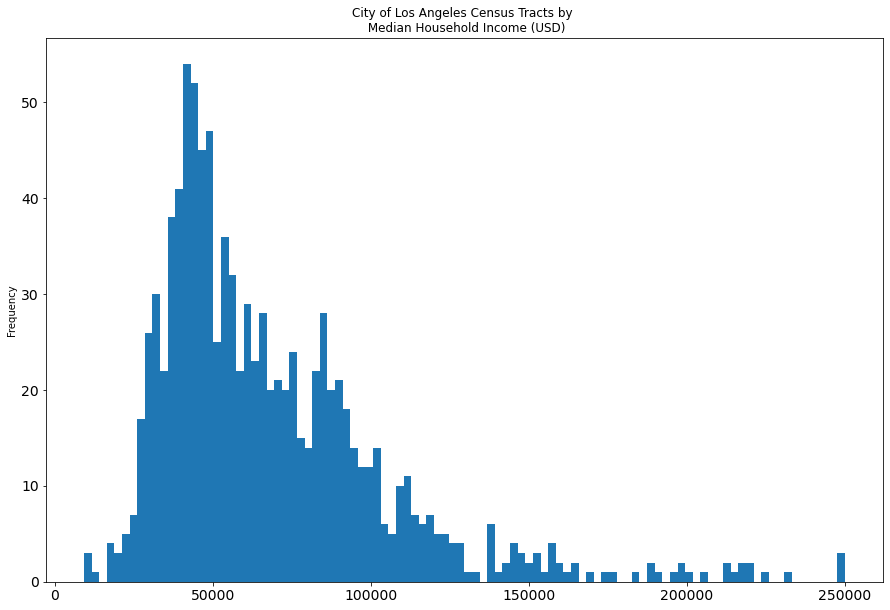

In [22]:
mhi['MHI'].plot.hist(figsize=(15,10),
                     bins=100,
                     title='City of Los Angeles Census Tracts by \n Median Household Income (USD)',
                    fontsize=14,
                     xlabel = 'Median Household Income (USD)'
                    )

We're now curious whether this skew towards higher-income census tracts is reflected by the data. We'll look at the mean, median, and general distribution information below:

In [23]:
mhi['MHI'].mean()

68203.51512096774

In [24]:
mhi['MHI'].median()

58398.5

In [25]:
mhi['MHI'].describe()

count       992.000000
mean      68203.515121
std       36642.300370
min        9191.000000
25%       42758.000000
50%       58398.500000
75%       85267.500000
max      250001.000000
Name: MHI, dtype: float64

Seeing the mean census tract MHI is higher than the median MHI, it looks like there are outlying census tracts with much higher MHI than a normal distribution would suggest.  Plotting the data and running this statistical analysis confirms LA contains outlying census tracts on the high end of MHI, with a positively-skewed distribution shown in the histogram. The highest frequency of census tract MHI is around \\$50,000, but there are smaller frequencies of much higher MHI, with the highest at almost \\$250,000 MHI. The 75th percentile of all census tracts is only \\$85,268, which less than half of the highest end census tracts.

Based on this information, we want to visually determine if bike infrastructure correlates with the MHI of census tracts in LA via a ma.

## Creating Bike Lane Map Superimposed above Census Tracts by Median Household Income in Los Angeles

First, I will load a web mercator projection for MHI and bikeway geospatial data so that a basemap will load properly underneath it. Then I will use the plt.subplots function to load both the bikeway infrastructure and census tracts by median household income above a basemap of LA. I first load the map by putting colors into classifications. The first classification is \\$9191 to \\$25750 because this bracket represents the census tract with the lowest MHI in all of LA (calculated from Group Assignment 2) up to the federal poverty level for a family of four as obtained from the [US Department of Health and Human Services](https://aspe.hhs.gov/topics/poverty-economic-mobility/poverty-guidelines/prior-hhs-poverty-guidelines-federal-register-references/2019-poverty-guidelines).

I import ListedColormap to manually designate the color for each of my income classification bins, which gives me flexibility to make the income map stand out beneath the blue bike lane map.

In [26]:
mhi_web_mercator = mhi.to_crs(epsg=3857)
bwy_web_mercator = bwy.to_crs(epsg=3857)
census_web_mercator = census.to_crs(epsg=3857)

In [125]:
from matplotlib.colors import ListedColormap

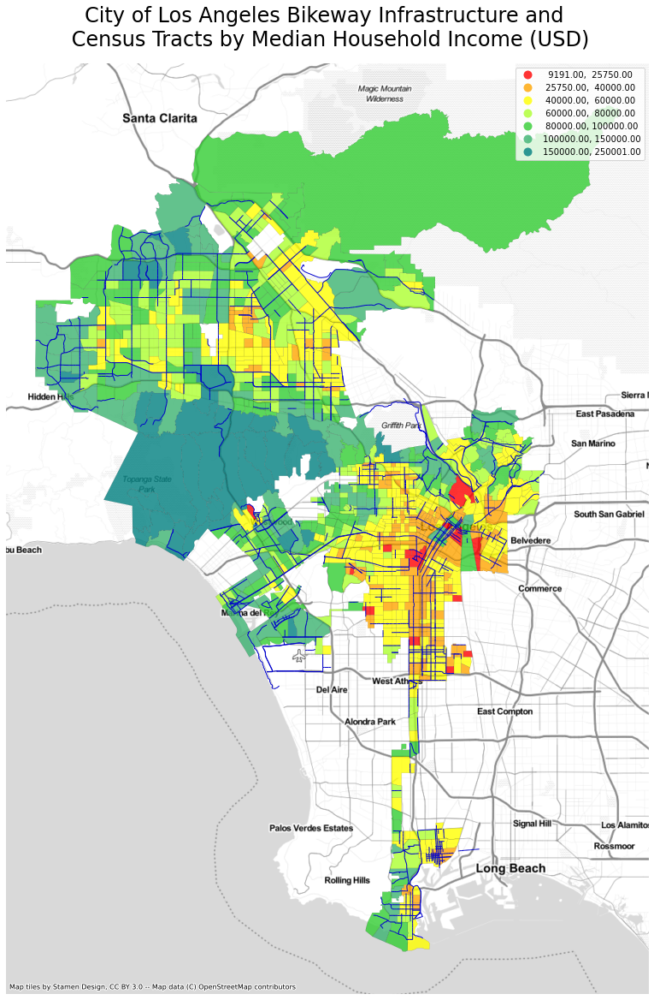

In [169]:
fig, ax = plt.subplots(figsize= (20,20))

mhi_web_mercator[mhi_web_mercator['MHI'] > 0].plot(
    ax = ax,
    column= 'MHI', 
    cmap = ListedColormap(['red', 'orange', 'yellow', 'greenyellow', 'limegreen', 'mediumseagreen', 'teal']),
    legend = True, 
    scheme = 'user_defined', 
    classification_kwds={'bins':[25750,40000,60000,80000,100000,150000]}, 
    edgecolor = 'black', 
    linewidth = 0.1, 
    alpha= 0.8
)

bwy_web_mercator.plot(
    ax=ax,
    alpha= 1,
    edgecolor = 'mediumblue',
    linewidth = 1
)

ax.axis('off')

ax.set_title('City of Los Angeles Bikeway Infrastructure and \n Census Tracts by Median Household Income (USD)', fontsize=24, pad=20)

ctx.add_basemap(ax,source=ctx.providers.Stamen.TonerLite)

Alternatively, I can use a pre-set color map. Here we can see how the wide range of the income, skewed by outliers on the high end, can skew the range of the visuals. The pre-set color map automatically sets the \\$80,000 to \\$100,000 to yellow, even though in reality that's the 75th percentile. Neighborhoods between \\$40,000 and \\$60,000 are orange, even though the median MHI city's median and many of the LA neighborhoods are in this range.

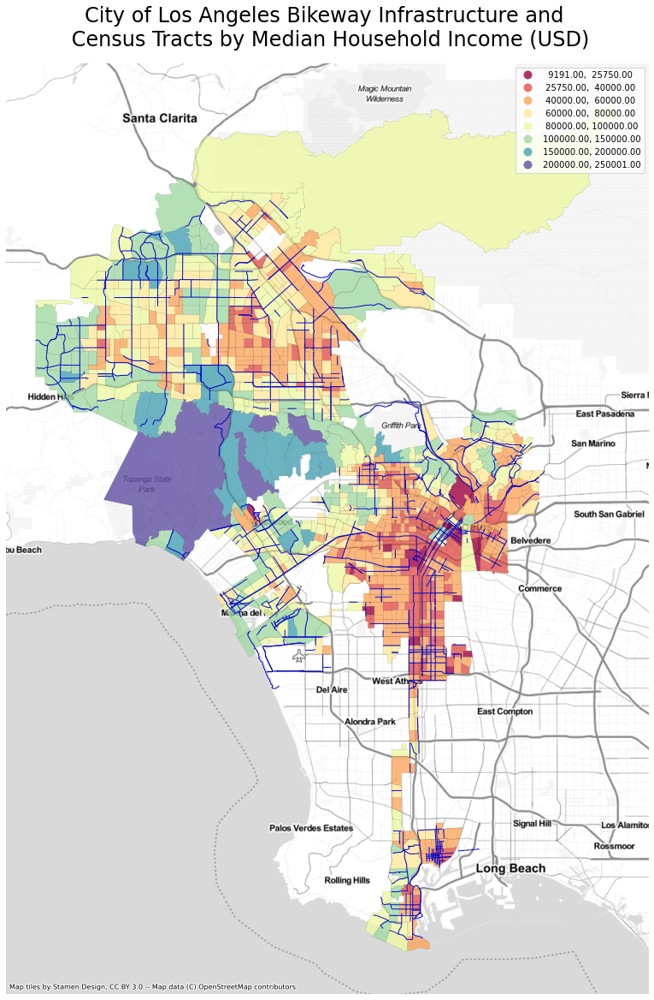

In [171]:
fig, ax = plt.subplots(figsize= (20,20))

mhi_web_mercator[mhi_web_mercator['MHI'] > 0].plot(
    ax = ax,
    column= 'MHI', 
    cmap = 'Spectral',
    legend = True, 
    scheme = 'user_defined', 
    classification_kwds={'bins':[25750,40000,60000,80000,100000,150000,200000,]}, 
    edgecolor = 'black', 
    linewidth = 0.1, 
    alpha= 0.8
)

bwy_web_mercator.plot(
    ax=ax,
    edgecolor='mediumblue',
    alpha= 1,
    linewidth = 1
)

ax.axis('off')

ax.set_title('City of Los Angeles Bikeway Infrastructure and \n Census Tracts by Median Household Income (USD)', fontsize=24, pad=20)

ctx.add_basemap(ax,source=ctx.providers.Stamen.TonerLite)

At first glance, there doesn't to be much correlation between bike paths and MHI. However, upon closer inspection it does appear that lower-income census tracts have some more bike paths than the census tracts with much higher MHI. 

For example, the community of Wilmington (part of the south tip immediately west of Long Beach) is a lower-income residential community with possibly the highest concentration of bike lanes outside of Downtown LA. However, Streetsblog LA notes that [Wilmington's streetscape is not conducive to biking, and its dense bike network is not connected well to neighboring Long Beach or San Pedro on either side](https://la.streetsblog.org/2014/09/11/wilmingtons-new-bike-lane-network-and-what-it-does-and-doesnt-do/). As a result, the bikeways are not as useful as it first appears on a birds-eye view of the community. 

The richest parts of LA in deep-red have virtually zero bike paths, but this appears to be partly explained by the tough terrain and narrow streets of the hillsides that would prohibit bike lanes. However, existing residents' political and financial power to resist new bike lanes may also play a role as well.

Let's also use a color scheme that's not in user-defined brackets and see how it maps out. As we'll see, the few census tracts on the higher end of the income spectrum drags out the range of the color map. 

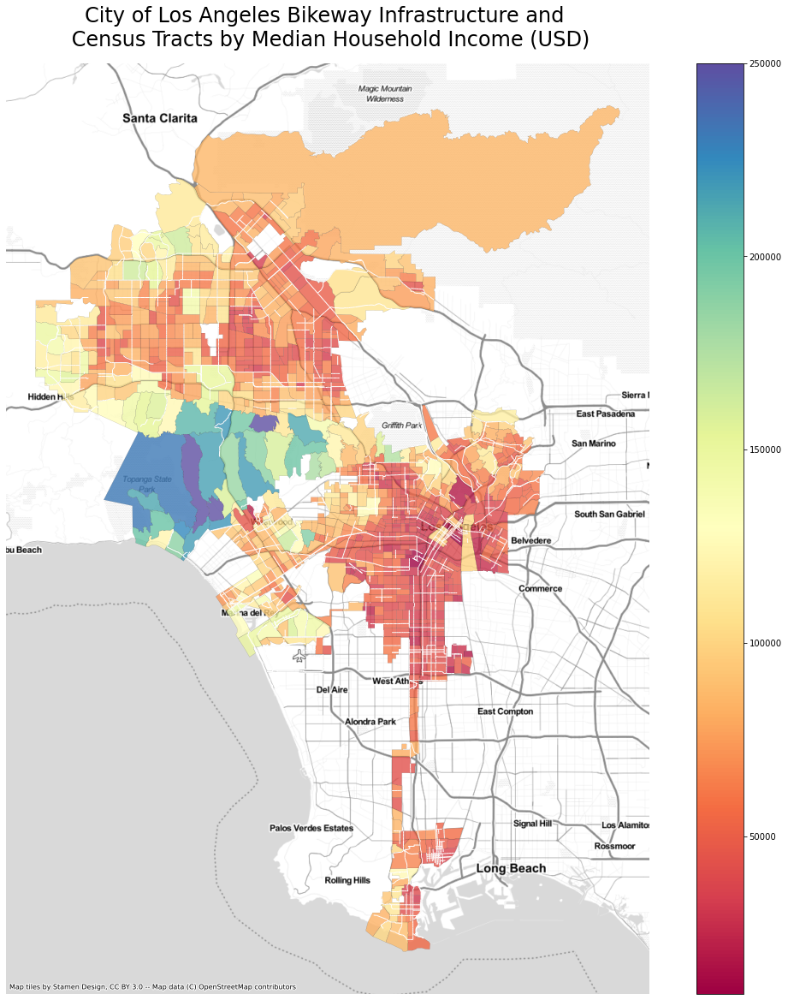

In [135]:
fig, ax = plt.subplots(figsize= (20,20))

mhi_web_mercator[mhi_web_mercator['MHI'] > 0].plot(
    ax = ax,
    column= 'MHI', 
    cmap = 'Spectral', 
    legend = True, 
    edgecolor = 'black', 
    linewidth = 0.1, 
    alpha= 0.8
)

bwy_web_mercator.plot(
    ax=ax,
    edgecolor = 'white',
    linewidth = 1
)

ax.axis('off')

ax.set_title('City of Los Angeles Bikeway Infrastructure and \n Census Tracts by Median Household Income (USD)', fontsize=24, pad=20)

ctx.add_basemap(ax,source=ctx.providers.Stamen.TonerLite)

### Transforming CSV to a Dataframe

In [29]:
geometry = [Point(xy) for xy in zip(df.Longitude, df.Latitude)]
df = df.drop(['Longitude', 'Latitude'], axis=1)
gdf = GeoDataFrame(df, crs="EPSG:4326", geometry=geometry)

Here we are just checking that when we coverted by csv to a dataframe nothing was changed.

In [30]:
gdf.head()

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO_Codes,Victim Age,Victim Sex,Victim_Descent,Premise Code,Premise Description,Address,Cross Street,Lat,Long,geometry
0,190617851,8/24/19,8/24/19,1115,6,Hollywood,615,997,TRAFFIC COLLISION,Veh vs Bike,52.0,M,White,101.0,STREET,BARHAM BL,WINNIE DR,34.1347,-118.3427,POINT (-118.34270 34.13470)
1,190715500,8/22/19,8/21/19,2230,7,Wilshire,727,997,TRAFFIC COLLISION,Veh vs Bike,24.0,F,Hispanic/Latin/Mexican,101.0,STREET,BEVERLY BL,LA BREA AV,34.0762,-118.3441,POINT (-118.34410 34.07620)
2,190715796,8/27/19,8/27/19,1420,7,Wilshire,745,997,TRAFFIC COLLISION,Veh vs Bike,46.0,M,Other,101.0,STREET,LA BREA AV,SYCAMORE AV,34.0562,-118.3449,POINT (-118.34490 34.05620)
3,190814721,8/22/19,8/22/19,1730,8,West LA,842,997,TRAFFIC COLLISION,Veh vs Bike,32.0,M,White,101.0,STREET,SANTA MONICA BL,BARRINGTON AV,34.0465,-118.4588,POINT (-118.45880 34.04650)
4,190814726,8/20/19,8/20/19,825,8,West LA,851,997,TRAFFIC COLLISION,Veh vs Bike,24.0,M,Other Asian,101.0,STREET,BROCKTON AV,SANTA MONICA BL,34.0398,-118.4598,POINT (-118.45980 34.03980)


Next, we are plotting it to see what the data we are working with looks like, and that we also make sure that it is being mapped correctly. 

<AxesSubplot:>

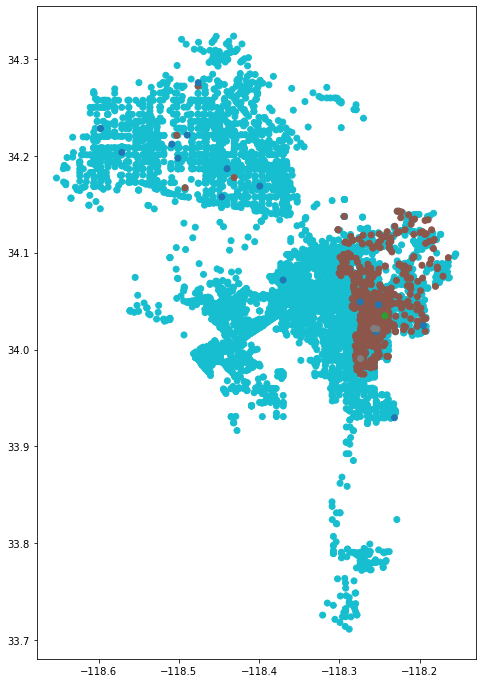

In [31]:
gdf.plot(
            figsize=(20,12),   #size of the plot (a bit bigger than the default)
            column = 'MO_Codes',   # column that defines the color of the dots
)

### Importing Additional Libraries to Work with the Data

This include libraries so that we are able to graph the data and plot it.

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# for basemaps
import contextily as ctx
# for interactive plots
import plotly.express as px

In [33]:
# reproject to Web Mercator
osm_web_mercator = gdf.to_crs(epsg=3857)

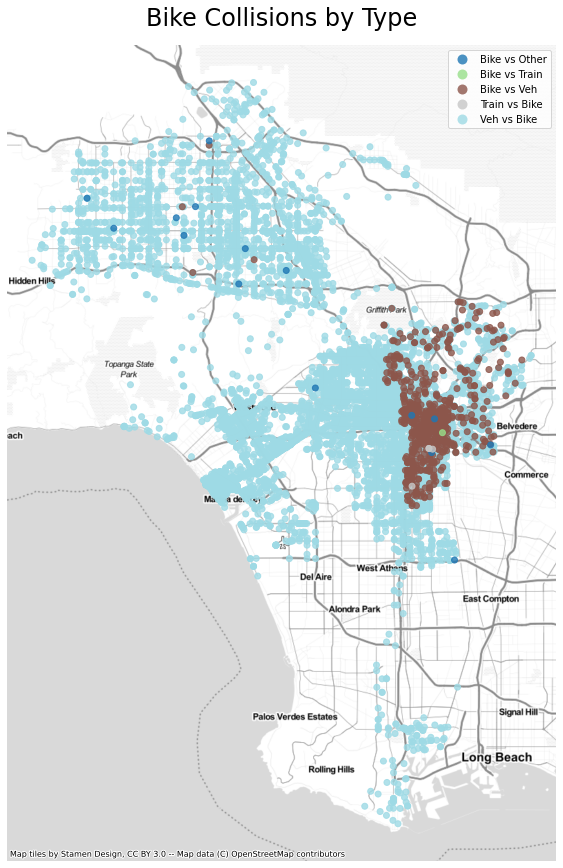

In [34]:
fig,ax = plt.subplots(figsize=(15,15))

osm_web_mercator.plot(ax=ax,
                    column='MO_Codes',
                    cmap='tab20',
                    alpha=0.8,
                    legend=True, 
                   )

# get rid of the axis
ax.axis('off');

ax.set_title("Bike Collisions by Type",fontsize=24,pad=20)


# basemap from carto that has a dark background (easier to see)
ctx.add_basemap(ax,source=ctx.providers.Stamen.TonerLite)

In ‘Bike Collisions by Victim Descent’ we see just by the amount of color that Hispanics and Blacks are the largest races to be involved in  bike collisions. We see that Hispanic bike collisions are more widely distributed around the City of LA, and those for Blacks tends to be concentrated in east of Downtown LA. 

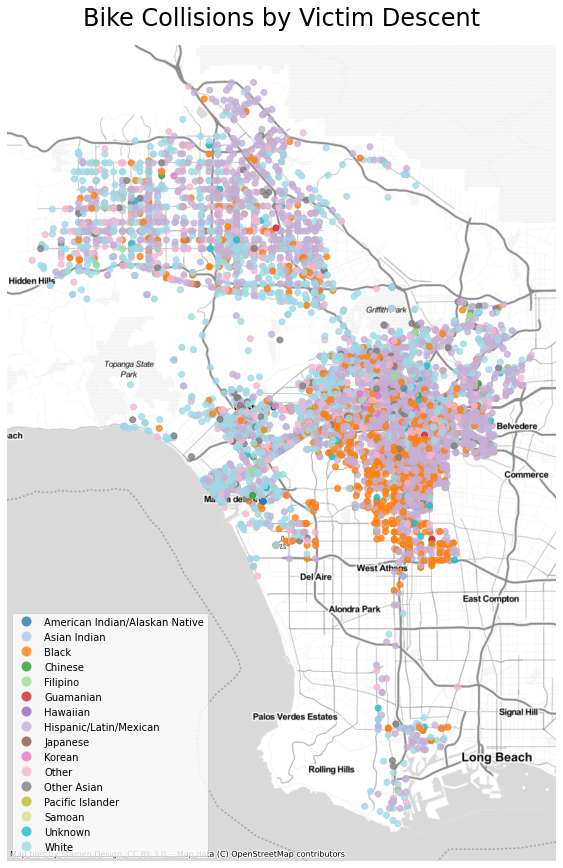

In [35]:
fig,ax = plt.subplots(figsize=(15,15))

osm_web_mercator.plot(ax=ax,
                    column='Victim_Descent',
                    cmap='tab20',
                    alpha=0.8,
                    legend=True,  
                   )

# get rid of the axis
ax.axis('off');

ax.set_title("Bike Collisions by Victim Descent",fontsize=24,pad=20)

# basemap from carto that has a dark background (easier to see)
ctx.add_basemap(ax,source=ctx.providers.Stamen.TonerLite)

In ‘bike Collisions by Type’ we that that the majority of the the bike accidents are vehicle vs bike, but interestingly enough we see that in east there is a concentration of bike vs vehicle. 

Next, let's plot and look over the census data to confirm it is loaded properly.

<AxesSubplot:>

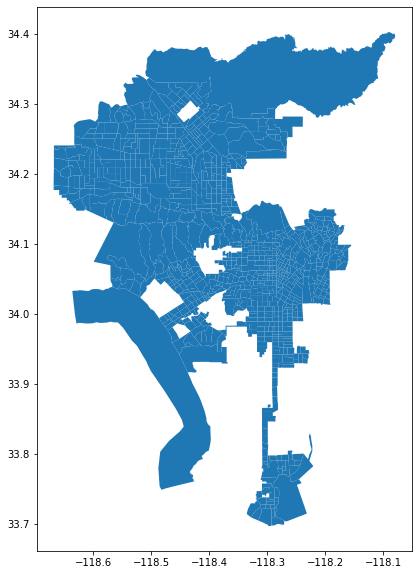

In [36]:
census.plot(figsize=(10,10))

In [37]:
census.tail()

,geoid,name,B03002001,"B03002001, Error",B03002002,"B03002002, Error",B03002003,"B03002003, Error",B03002004,"B03002004, Error",...,"B03002017, Error",B03002018,"B03002018, Error",B03002019,"B03002019, Error",B03002020,"B03002020, Error",B03002021,"B03002021, Error",geometry
999,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,75.0,169.0,73.0,136.0,72.0,16.0,17.0,...,12.0,14.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
1000,14000US06037980026,"Census Tract 9800.26, Los Angeles, CA",26.0,18.0,19.0,18.0,7.0,10.0,11.0,11.0,...,12.0,4.0,8.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
1001,14000US06037980028,"Census Tract 9800.28, Los Angeles, CA",0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,178.0,788.0,161.0,393.0,108.0,232.0,97.0,...,12.0,73.0,34.0,32.0,34.0,27.0,34.0,5.0,7.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
1003,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


<AxesSubplot:>

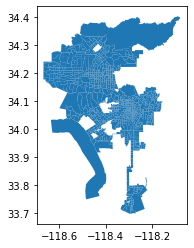

In [38]:
census.plot()

We rename the columns of the racial data from their census code to the racial category they represent.

In [39]:
columns_to_keep = ['geoid',
 'name',
 'B03002001',
 'B03002002',
 'B03002003',
 'B03002004',
 'B03002005',
 'B03002006',
 'B03002007',
 'B03002008',
 'B03002009',
 'B03002012',
 'geometry']

In [40]:
census = census[columns_to_keep]

In [41]:
census.columns = ['geoid',
 'name',
 'Total',
 'Non Hispanic',
 'White',
 'Black',
 'American Indian and Alaska Native',
 'Asian',
 'Native Hawaiian and Other Pacific Islander',
 'Some other race',
 'Two or more races',
 'Hispanic',
 'geometry']

Let's check the data.

In [42]:
census.head()

,geoid,name,Total,Non Hispanic,White,Black,American Indian and Alaska Native,Asian,Native Hawaiian and Other Pacific Islander,Some other race,Two or more races,Hispanic,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,3095.0,2616.0,19.0,3.0,331.0,3.0,8.0,115.0,1188.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,3258.0,2882.0,74.0,15.0,220.0,0.0,0.0,67.0,147.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3731.0,2986.0,198.0,0.0,486.0,0.0,47.0,14.0,2616.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,2338.0,1812.0,87.0,0.0,341.0,0.0,0.0,98.0,1364.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,3587.0,3126.0,205.0,0.0,194.0,0.0,0.0,62.0,297.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


Let's also check the geodataframe to make sure it loads the plot properly.

<AxesSubplot:>

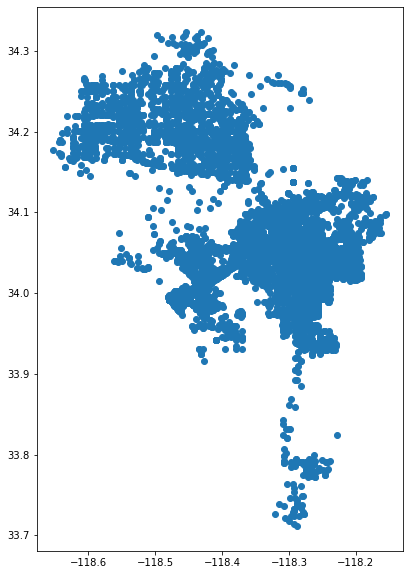

In [43]:
gdf.plot(figsize=(10,10))

Now that we've ensured the bike collisions are loaded correctly, let's use a spatial join to match them up with each census tract.

In [44]:
census_gdf = gpd.sjoin(census, gdf) #Spatial join Points to polygons
census_gdf

,geoid,name,Total,Non Hispanic,White,Black,American Indian and Alaska Native,Asian,Native Hawaiian and Other Pacific Islander,Some other race,...,MO_Codes,Victim Age,Victim Sex,Victim_Descent,Premise Code,Premise Description,Address,Cross Street,Lat,Long
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,3095.0,2616.0,19.0,3.0,331.0,3.0,8.0,...,Veh vs Bike,24.0,F,Hispanic/Latin/Mexican,101.0,STREET,APPERSON ST,FOOTHILL BL,34.2560,-118.2979
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,3095.0,2616.0,19.0,3.0,331.0,3.0,8.0,...,Veh vs Bike,26.0,M,Hispanic/Latin/Mexican,101.0,STREET,FOOTHILL,WYNGATE,34.2575,-118.3010
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3731.0,2986.0,198.0,0.0,486.0,0.0,47.0,...,Veh vs Bike,28.0,M,Other,101.0,STREET,FOOTHILL BL,DAY ST,34.2545,-118.2979
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,2338.0,1812.0,87.0,0.0,341.0,0.0,0.0,...,Veh vs Bike,22.0,M,White,101.0,STREET,FOOTHILL BL,TUJUNGA CANYON BL,34.2476,-118.2794
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,2338.0,1812.0,87.0,0.0,341.0,0.0,0.0,...,Veh vs Bike,NaN,M,Hispanic/Latin/Mexican,101.0,STREET,FOOTHILL,HAINES CANYON,34.2476,-118.2794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,788.0,393.0,232.0,26.0,36.0,24.0,25.0,...,Veh vs Bike,26.0,F,Hispanic/Latin/Mexican,101.0,STREET,7TH ST,HARBOR BL,33.7378,-118.2799
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,788.0,393.0,232.0,26.0,36.0,24.0,25.0,...,Veh vs Bike,39.0,F,Hispanic/Latin/Mexican,101.0,STREET,OFARRELL ST,CENTER ST,33.7489,-118.2798
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,788.0,393.0,232.0,26.0,36.0,24.0,25.0,...,Veh vs Bike,78.0,M,White,101.0,STREET,JOHN S GIBSON,HARBOR FY,33.7613,-118.2819
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,788.0,393.0,232.0,26.0,36.0,24.0,25.0,...,Veh vs Bike,40.0,M,Hispanic/Latin/Mexican,101.0,STREET,MINER AV,22ND ST,33.7262,-118.2783


Now we create a new dataframe called "MO_Codes" and merge it with the census data.

In [45]:
MO_Codes = census_gdf.value_counts('name').reset_index(name='MO_Codes')
MO_Codes

,name,MO_Codes
0,"Census Tract 2260.02, Los Angeles, CA",154
1,"Census Tract 2077.10, Los Angeles, CA",146
2,"Census Tract 2240.20, Los Angeles, CA",99
3,"Census Tract 2079, Los Angeles, CA",84
4,"Census Tract 2060.31, Los Angeles, CA",78
...,...,...
930,"Census Tract 1397.03, Los Angeles, CA",1
931,"Census Tract 1411.02, Los Angeles, CA",1
932,"Census Tract 1415, Los Angeles, CA",1
933,"Census Tract 1439.02, Los Angeles, CA",1


In [46]:
census = census.merge(MO_Codes, how='left', on='name')

Now, we test and check the data again.

In [47]:
census.sample(5)

,geoid,name,Total,Non Hispanic,White,Black,American Indian and Alaska Native,Asian,Native Hawaiian and Other Pacific Islander,Some other race,Two or more races,Hispanic,geometry,MO_Codes
159,14000US06037121801,"Census Tract 1218.01, Los Angeles, CA",3127.0,807.0,568.0,95.0,0.0,91.0,0.0,9.0,44.0,2320.0,"MULTIPOLYGON (((-118.39652 34.21572, -118.3944...",4.0
450,14000US06037192510,"Census Tract 1925.10, Los Angeles, CA",3840.0,1831.0,231.0,14.0,0.0,1479.0,14.0,0.0,93.0,2009.0,"MULTIPOLYGON (((-118.30916 34.07988, -118.3091...",15.0
892,14000US06037271600,"Census Tract 2716, Los Angeles, CA",4811.0,4137.0,2211.0,198.0,14.0,1402.0,0.0,0.0,312.0,674.0,"MULTIPOLYGON (((-118.43865 34.02268, -118.4366...",7.0
26,14000US06037104404,"Census Tract 1044.04, Los Angeles, CA",3084.0,217.0,80.0,62.0,0.0,67.0,0.0,0.0,8.0,2867.0,"MULTIPOLYGON (((-118.43527 34.26176, -118.4336...",6.0
842,14000US06037264301,"Census Tract 2643.01, Los Angeles, CA",5552.0,5155.0,4084.0,139.0,0.0,718.0,0.0,47.0,167.0,397.0,"MULTIPOLYGON (((-118.47001 34.05259, -118.4670...",9.0


In [48]:
census.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1004 entries, 0 to 1003
Data columns (total 14 columns):
 #   Column                                      Non-Null Count  Dtype   
---  ------                                      --------------  -----   
 0   geoid                                       1004 non-null   object  
 1   name                                        1004 non-null   object  
 2   Total                                       1004 non-null   float64 
 3   Non Hispanic                                1004 non-null   float64 
 4   White                                       1004 non-null   float64 
 5   Black                                       1004 non-null   float64 
 6   American Indian and Alaska Native           1004 non-null   float64 
 7   Asian                                       1004 non-null   float64 
 8   Native Hawaiian and Other Pacific Islander  1004 non-null   float64 
 9   Some other race                             1004 non-null   float6

## Bikeways and Bike Collision Data

Now we load the bikeway and bike collision data. We then plot both sets of data on top of each other to see if there is a correlating pattern.

In [49]:
bwy = gpd.read_file('City_of_Los_Angeles_Bikeways.geojson')

In [50]:
bwy.head()

,OBJECTID_12,SECT_ID,STREET_DES,OTHER,STR_FROM,STR_TO,ST_TYPE,WIDTH_,CL_Miles,Lane_Miles,...,Comments,Tag,Level_Protection,Level_ProtectionNotes,Level_Protetion2,Project_Name,Year_,Shape__Length,GlobalID,geometry
0,1,3548700,Avenue III,,6TH ST,4TH PL / SANTA FE AV,,0.0,0.067215,0.134431,...,,1.0,0.0,None,0,None,2019.0,354.897441,110d2e43-5f4a-4faa-af3d-3aa23a7a3d1b,"LINESTRING Z (-118.23294 34.04017 0.00000, -11..."
1,2,3548600,Avenue III,,6TH ST,4TH PL / SANTA FE AV,,0.0,0.051044,0.102089,...,,2.0,0.0,None,0,None,2019.0,269.514341,dbe20dba-a276-4724-90e7-b97197e67a4a,"LINESTRING Z (-118.23311 34.04119 0.00000, -11..."
2,3,3548600,Avenue III,,6TH ST,4TH PL / SANTA FE AV,,0.0,0.019490,0.038979,...,,3.0,0.0,None,0,None,2019.0,102.905742,40f564ba-03b0-4562-90e9-19c69778fe77,"LINESTRING Z (-118.23299 34.04045 0.00000, -11..."
3,4,3548800,Avenue III,,6TH ST,4TH PL / SANTA FE AV,,0.0,0.056009,0.112019,...,,4.0,0.0,None,0,None,2019.0,295.730268,8caa44c8-d8ae-4bd8-8d3e-fd2a903eaa7d,"LINESTRING Z (-118.23283 34.03920 0.00000, -11..."
4,5,6739300,Local Street,S RDWY,HOBART BL,WESTERN AV,Local,30.0,0.066304,0.066304,...,,6.0,0.0,None,0,None,2005.0,350.087190,40087818-8960-48f0-959b-031af4aa4dbe,"LINESTRING Z (-118.30786 33.94680 0.00000, -11..."


Text(0.5, 1.0, 'Bike Collisions and Bike Lanes in LA')

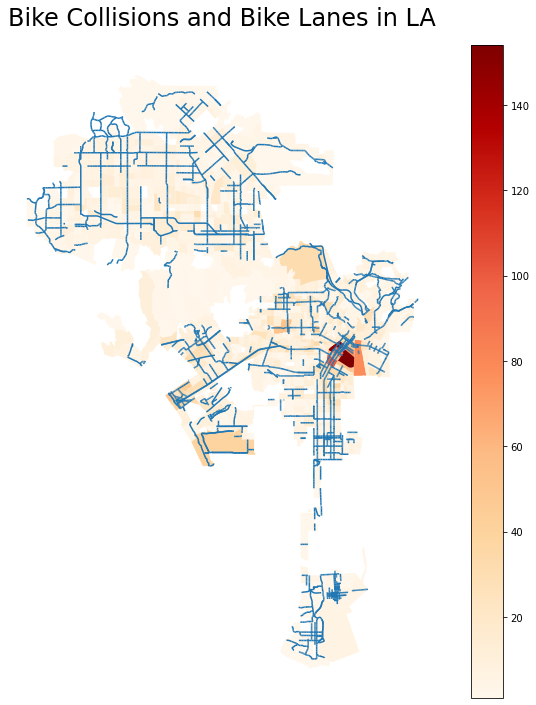

In [51]:
fig,ax = plt.subplots(figsize=(12,12))

census.plot(ax=ax,column='MO_Codes',legend=True,cmap='OrRd')

ax.axis('off') #to get rid of axes numbers

bwy.plot(ax=ax)

ax.set_title("Bike Collisions and Bike Lanes in LA",fontsize=24,pad=20)

In these map we see bike collisions concentrations by census tracts. So the darker the census tracts the higher count of bike collisions that census tract has had. Here we see that Downtown LA and Skid Row (officially know as Central City East) have the highest number of reported bike collisions. In these areas, were bike collision is high we are able to see that there is lack of bike infrastructure. 

Next, let's add a basemap below the bike lanes to understand their relative positions in the city of LA.

In [52]:
mhi_web_mercator = mhi.to_crs(epsg=3857)
census_web_mercator = census.to_crs(epsg=3857)
bwy_web_mercator = bwy.to_crs(epsg=3857)

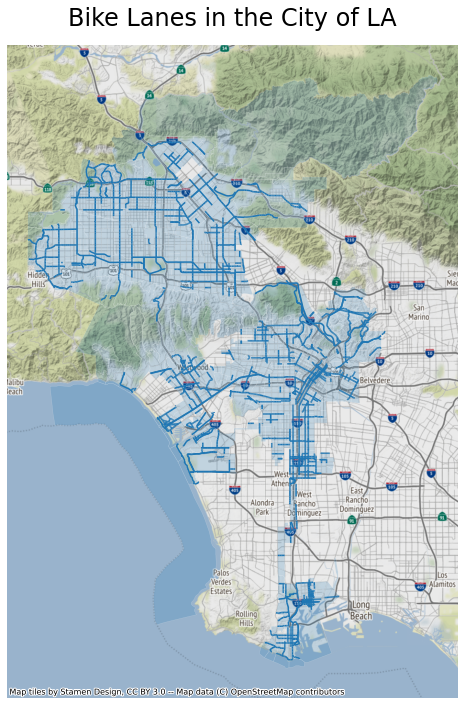

In [53]:
fig,ax = plt.subplots(figsize=(12,12))

bwy_web_mercator.plot(ax=ax)

census_web_mercator.plot(ax=ax,
                        alpha=0.2,
                        linewidth=0.5,
                        edgecolor='white')

ax.axis('off')

ax.set_title("Bike Lanes in the City of LA",fontsize=24,pad=20)

ctx.add_basemap(ax)

In the map on the right we are able to see the bikeline in LA overlay over a basemap to get a sense of which locations have access to a bike lane. 

Finally, we attempt to load the bike collisions plus the bike lanes atop the basemap.

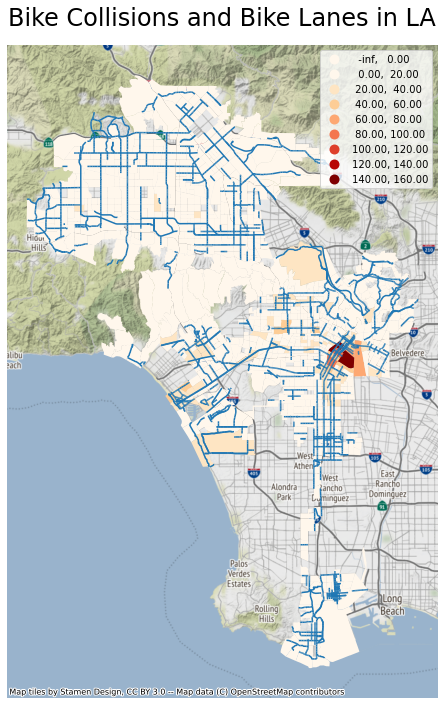

In [54]:
fig,ax = plt.subplots(figsize=(12,12))

census_web_mercator.plot(ax=ax,column='MO_Codes',
                         legend=True,
                         cmap='OrRd',
                        scheme = 'user_defined', 
        classification_kwds={'bins':[0,20,40,60,80,100,120,140,160]}, )

bwy_web_mercator.plot(ax=ax)

ax.axis('off')

ax.set_title("Bike Collisions and Bike Lanes in LA",fontsize=24,pad=20)

ctx.add_basemap(ax)

The basemap adds a lot of unnecessary data and clutter to the plot, so for our next maps we will not be adding it.

In [55]:
gdf.to_file('BikeAccidents.geojson')

/tmp/ipykernel_334/2582369786.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file('BikeAccidents.geojson')


## Bar Charts for Bike Collisions by Type and Victim's Racial Descent

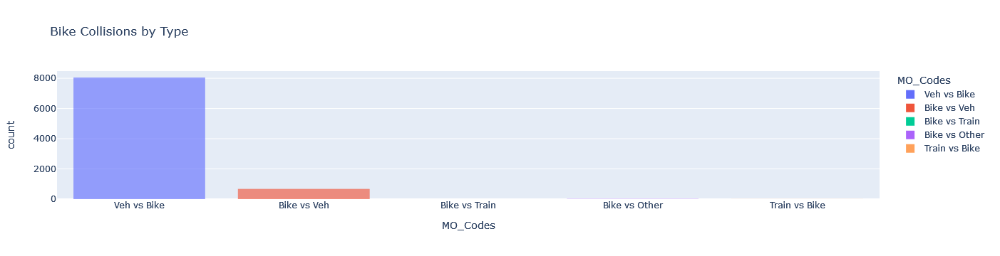

In [56]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(gdf,
       x='MO_Codes',
       title='Bike Collisions by Type',
        color='MO_Codes')

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

Taking a closer look at the counts of ‘Bike Collisions by Type’ we see that in total a little more than 8000 bike collisions are vehicle vs bike, this is followed by bike vs vehicle, bike vs train, bike vs other, and train vs bike. 

In [57]:
gdf.Victim_Descent.unique().tolist()

['White',
 'Hispanic/Latin/Mexican',
 'Other',
 'Other Asian',
 'Korean',
 nan,
 'Unknown',
 'Black',
 'Filipino',
 'Pacific Islander',
 'Asian Indian ',
 'Chinese',
 'Hawaiian',
 'Samoan',
 'Japanese',
 'American Indian/Alaskan Native',
 'Guamanian']

In [58]:
collision_by_descent = gdf.value_counts('Victim_Descent').reset_index(name='count')
collision_by_descent

,Victim_Descent,count
0,Hispanic/Latin/Mexican,4179
1,White,2101
2,Black,1190
3,Other,667
4,Other Asian,318
5,Unknown,111
6,Korean,60
7,Filipino,19
8,Chinese,9
9,Japanese,9


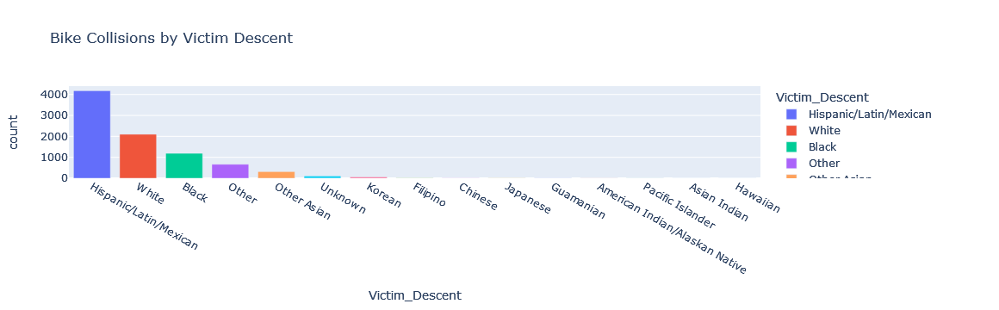

In [59]:
fig = px.bar(collision_by_descent.head(15),
       x='Victim_Descent',
       y='count',
       title='Bike Collisions by Victim Descent',
        color='Victim_Descent')

fig.show()

Looking at the counts for ‘Bike Collisions by Victim Descent’ we see that the top three race groups involved in bike collisions are Hispanics, White, and Black. 

## Diving Further into Bike Lanes By Race

Now we load the bike lanes atop a map of each census tract by the population count by the following races as designated by the US Census: Asian, Black or African, White, American Indian and Alaska Native. In these next graphs we are looking at race, and the relationship of having access to a bike lane. The darker the color represents a higher population size for the race we are examining. 

Text(0.5, 1.0, 'Bike Lanes in LA by Race: Asian')

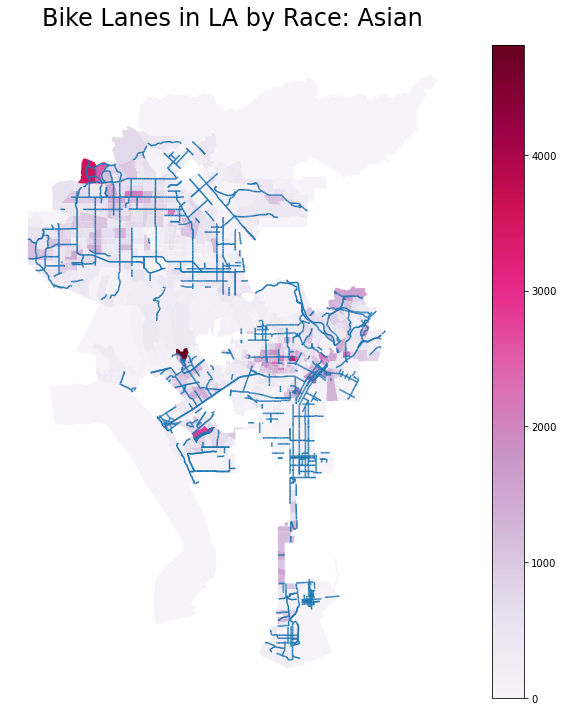

In [60]:
fig,ax = plt.subplots(figsize=(12,12))

census.plot(ax=ax,column='Asian',legend=True,cmap='PuRd')

bwy.plot(ax=ax)

ax.axis('off')

ax.set_title("Bike Lanes in LA by Race: Asian",fontsize=24,pad=20)

For census tracts where there is a high Asian population there seems for the most part to be a moderate bike infrastructure.

Text(0.5, 1.0, 'Bike Lanes in LA by Race: Black or African')

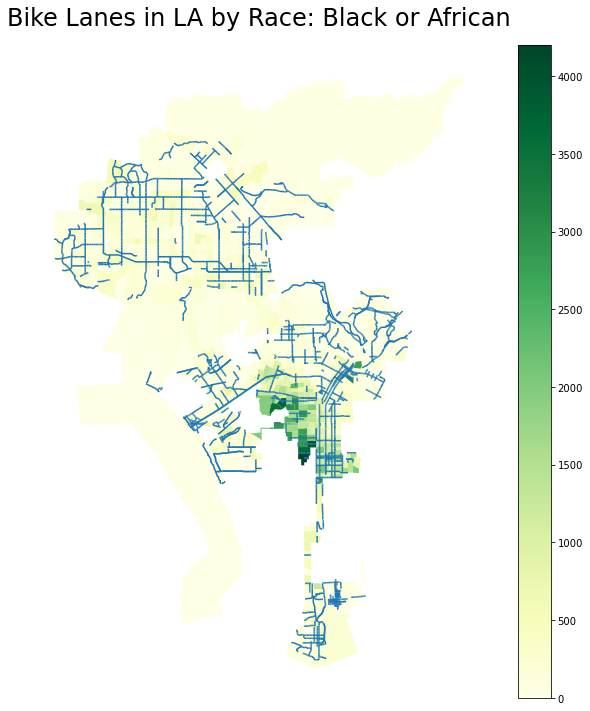

In [61]:
fig,ax = plt.subplots(figsize=(12,12))

census.plot(ax=ax,column='Black',legend=True,cmap='YlGn')

bwy.plot(ax=ax)

ax.axis('off')

ax.set_title("Bike Lanes in LA by Race: Black or African",fontsize=24,pad=20)

For census tracts where there is a high Black population there seems to be less bike infrastructure. 

Text(0.5, 1.0, 'Bike Lanes in LA by Race: White')

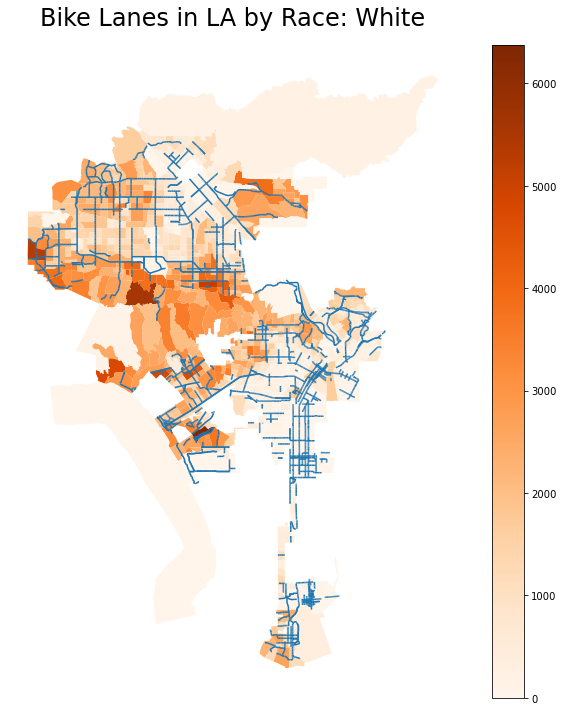

In [62]:
fig,ax = plt.subplots(figsize=(12,12))

census.plot(ax=ax,column='White',legend=True,cmap='Oranges')

bwy.plot(ax=ax)

ax.axis('off')

ax.set_title("Bike Lanes in LA by Race: White",fontsize=24,pad=20)

For census tracts where there is a high White population there seems to be a wider distribution of bike lanes, but we are not able to determine at this moment if there is higher bike infrastructure in these areas. 

Text(0.5, 1.0, 'Bike Lanes in LA by Race: \n American Indian and Alaska Native')

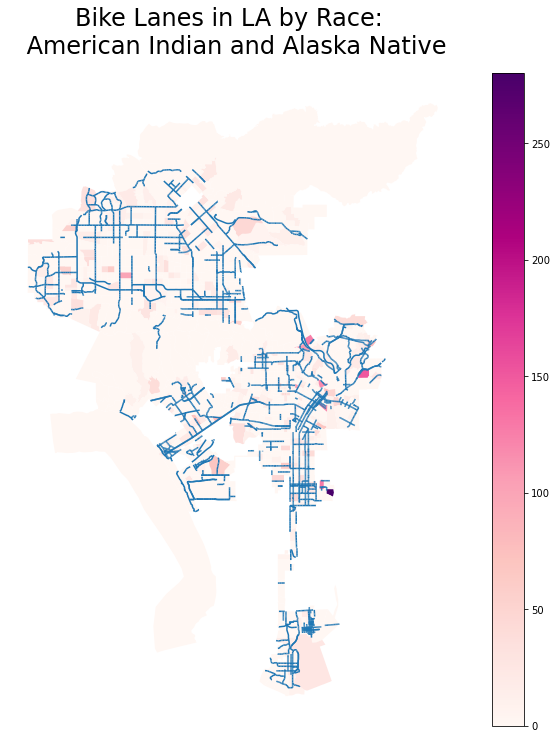

In [63]:
fig,ax = plt.subplots(figsize=(12,12))

census.plot(ax=ax,column='American Indian and Alaska Native',legend=True,cmap='RdPu')

bwy.plot(ax=ax)

ax.axis('off')

ax.set_title("Bike Lanes in LA by Race: \n American Indian and Alaska Native",fontsize=24,pad=20)

Text(0.5, 1.0, 'Bike Lanes in LA by Race: Hispanic/Latino')

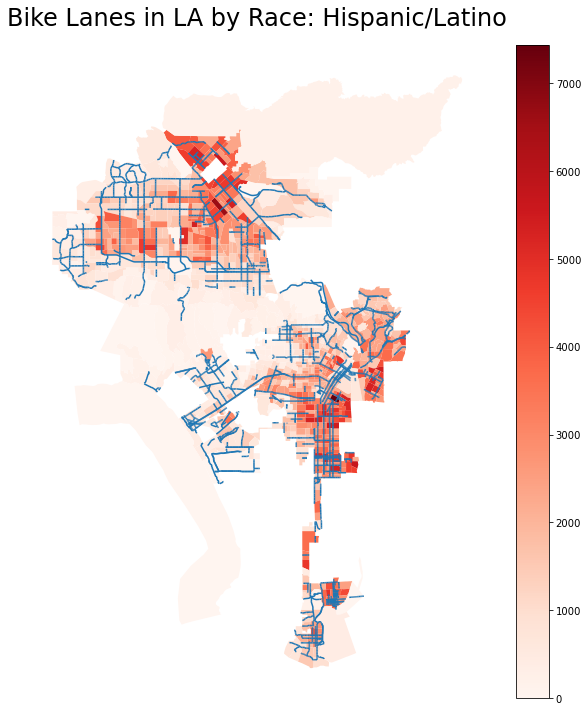

In [64]:
fig,ax = plt.subplots(figsize=(12,12))

census.plot(ax=ax,column='Hispanic',legend=True,cmap='Reds')

bwy.plot(ax=ax)

ax.axis('off')

ax.set_title("Bike Lanes in LA by Race: Hispanic/Latino",fontsize=24,pad=20)

### Plotly Express Scatter Mapbox

For our interactive map, we use Plotly Express Scatter Mapbox to load the points for each bike collision from the LAPD data. Each point represents a single incident that is color-coded by the type of collision and its latitude and longitude coordinates.

In [65]:
gdf.head()

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO_Codes,Victim Age,Victim Sex,Victim_Descent,Premise Code,Premise Description,Address,Cross Street,Lat,Long,geometry
0,190617851,8/24/19,8/24/19,1115,6,Hollywood,615,997,TRAFFIC COLLISION,Veh vs Bike,52.0,M,White,101.0,STREET,BARHAM BL,WINNIE DR,34.1347,-118.3427,POINT (-118.34270 34.13470)
1,190715500,8/22/19,8/21/19,2230,7,Wilshire,727,997,TRAFFIC COLLISION,Veh vs Bike,24.0,F,Hispanic/Latin/Mexican,101.0,STREET,BEVERLY BL,LA BREA AV,34.0762,-118.3441,POINT (-118.34410 34.07620)
2,190715796,8/27/19,8/27/19,1420,7,Wilshire,745,997,TRAFFIC COLLISION,Veh vs Bike,46.0,M,Other,101.0,STREET,LA BREA AV,SYCAMORE AV,34.0562,-118.3449,POINT (-118.34490 34.05620)
3,190814721,8/22/19,8/22/19,1730,8,West LA,842,997,TRAFFIC COLLISION,Veh vs Bike,32.0,M,White,101.0,STREET,SANTA MONICA BL,BARRINGTON AV,34.0465,-118.4588,POINT (-118.45880 34.04650)
4,190814726,8/20/19,8/20/19,825,8,West LA,851,997,TRAFFIC COLLISION,Veh vs Bike,24.0,M,Other Asian,101.0,STREET,BROCKTON AV,SANTA MONICA BL,34.0398,-118.4598,POINT (-118.45980 34.03980)


Here we are cleaning the data so that we only keep the columns that we are interested in.

In [66]:
gdf_mini = gdf[['MO_Codes','Victim_Descent','Lat','Long']].copy()

In [67]:
gdf_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8744 entries, 0 to 8743
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   MO_Codes        8744 non-null   object 
 1   Victim_Descent  8680 non-null   object 
 2   Lat             8744 non-null   float64
 3   Long            8744 non-null   float64
dtypes: float64(2), object(2)
memory usage: 273.4+ KB


In [68]:
# convert lat/lon's to floats
gdf_mini['Lat'] = gdf_mini['Lat'].astype(float)
gdf_mini['Long'] = gdf_mini['Long'].astype(float)
gdf_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8744 entries, 0 to 8743
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   MO_Codes        8744 non-null   object 
 1   Victim_Descent  8680 non-null   object 
 2   Lat             8744 non-null   float64
 3   Long            8744 non-null   float64
dtypes: float64(2), object(2)
memory usage: 273.4+ KB


Let's load Plotly Express first to see if the datapoints appear properly on the map.

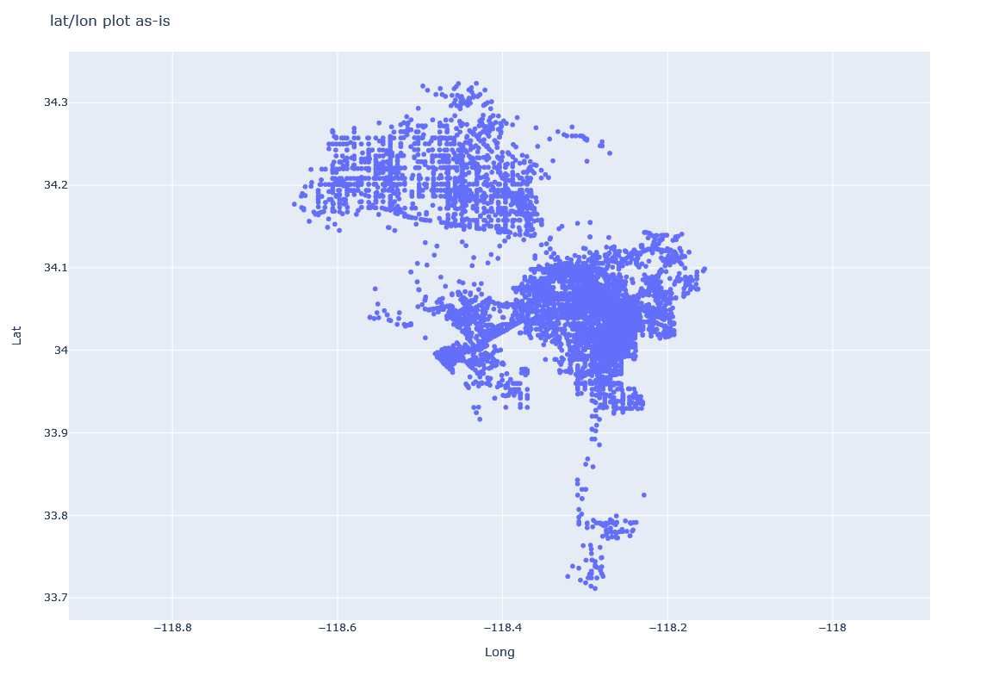

In [69]:
# plot it
fig = px.scatter(gdf_mini,
           x='Long',
           y='Lat'
)

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "lat/lon plot as-is"
)

# make it a square grid
fig.update_yaxes(
    scaleanchor = "x",
    scaleratio = 1,
)

fig.show()

Now we add the basemap below the datapoints we've added onto Plotly Express.

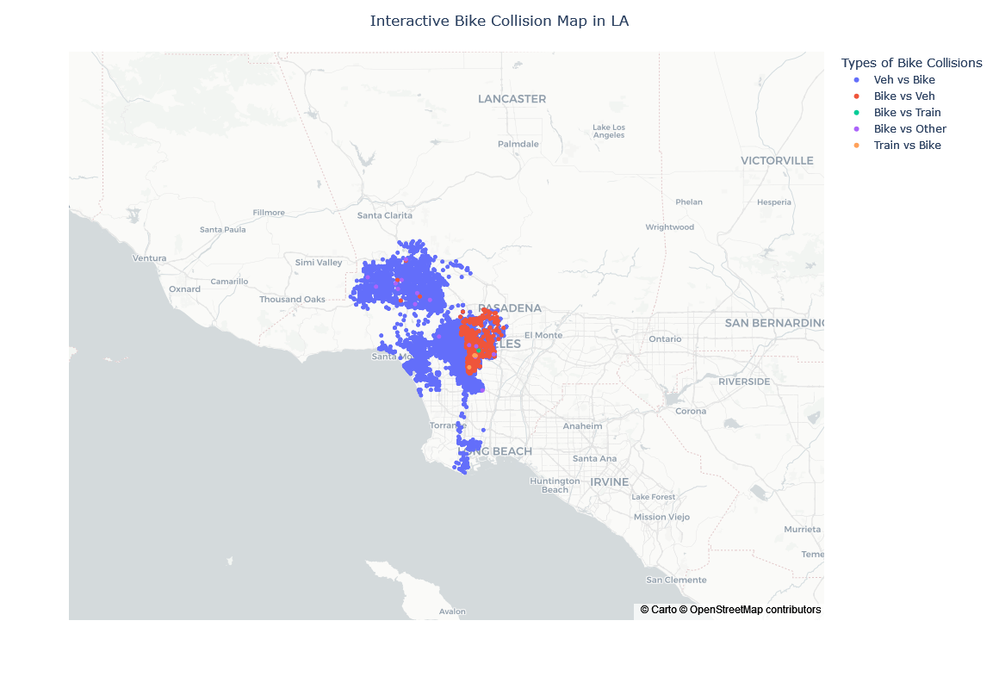

In [172]:
fig = px.scatter_mapbox(gdf_mini,
                        lat='Lat',
                        lon='Long',
                        color="MO_Codes",
                        labels={'MO_Codes':'Types of Bike Collisions'},
                        mapbox_style="carto-positron")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive Bike Collision Map in LA",
    title_x=0.5 # aligns title to center
)

fig.show()


In [71]:
# save the interactive maps as an html file
fig.write_html('bikecollision.html')
# the html file shows a blank map

#### Link to our Jupyter notebook to see our Plotly Express interactive mapbox since it is not loading on GitHub properly:
https://jupyter.idre.ucla.edu/user/baileylai23@ucla.edu/doc/tree/up206a_Monica-Bailey/GroupAssignments/Midterm_Monica%26Bailey.ipynb

## Creating a for loop

We want to create a for loop for the race maps we created previously. Using a for loop reduces the amount of repeating code we are using for each race by creating lists for pieces of the code that will change. We want different color maps for each map, so we create a second list called cmaps. After that, we use the zip() function in the for loop to merge the two lists, race and cmaps, to match the plot of each race with their respective color map. In the for loop, race and cmaps are designated as x and y, respectively.

In [72]:
race = ['White',
 'Black',
 'American Indian and Alaska Native',
 'Asian',
 'Native Hawaiian and Other Pacific Islander',
 'Some other race',
 'Hispanic']

In [73]:
print(race)

['White', 'Black', 'American Indian and Alaska Native', 'Asian', 'Native Hawaiian and Other Pacific Islander', 'Some other race', 'Hispanic']


In [97]:
cmaps = ['Oranges', 
         'YlGn', 
         'RdPu', 
         'PuRd', 
         'YlOrBr',
         'Reds',
         'Purples']

In [98]:
print(cmaps)

['Oranges', 'YlGn', 'RdPu', 'PuRd', 'YlOrBr', 'Reds', 'Purples']


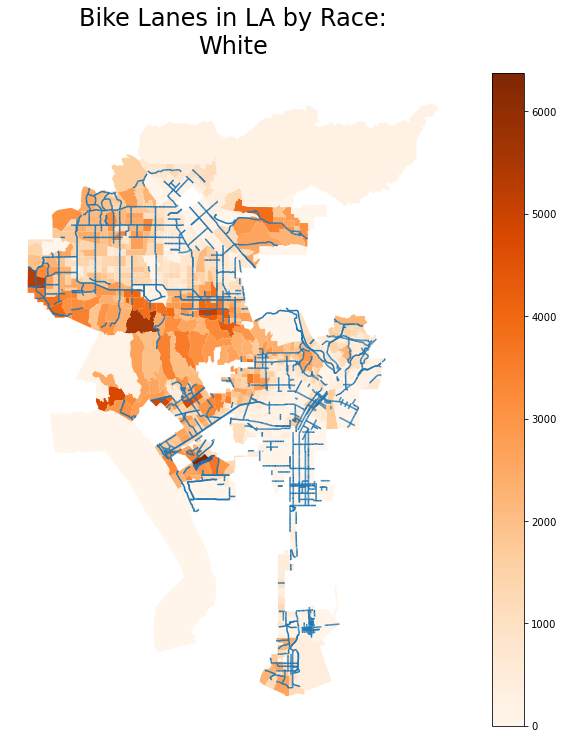

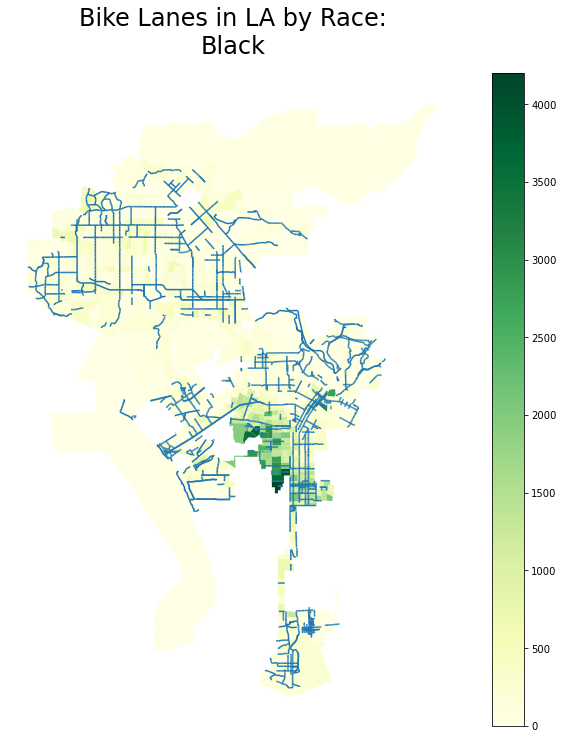

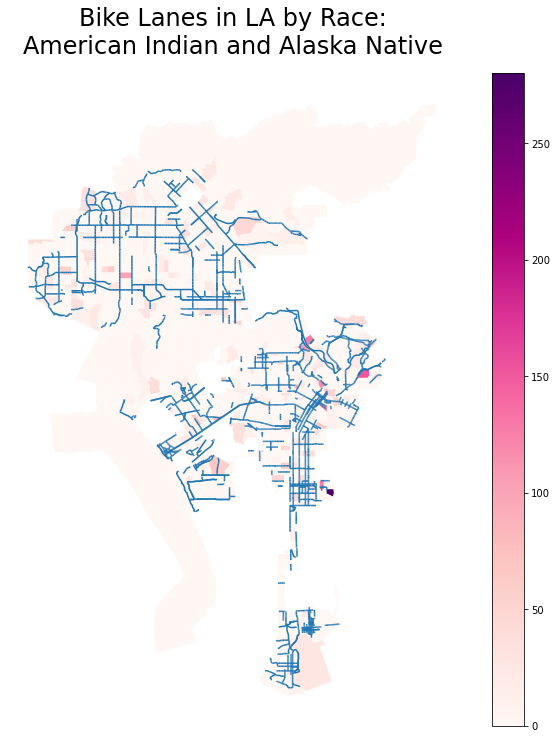

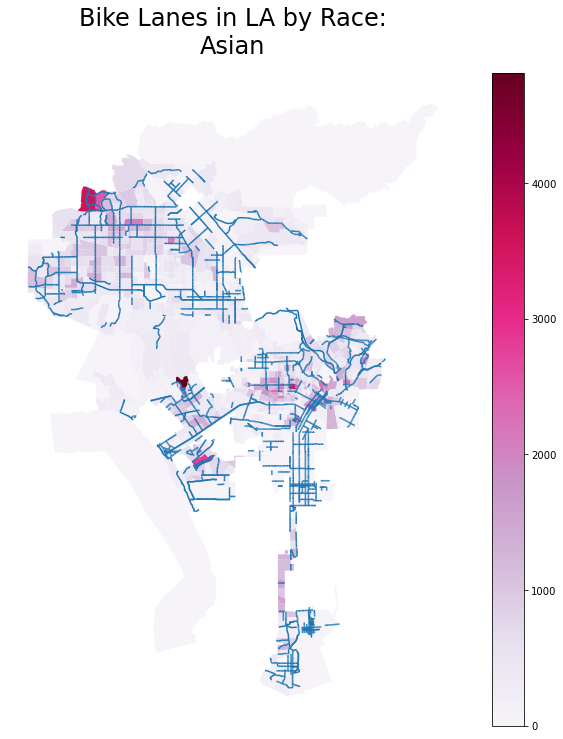

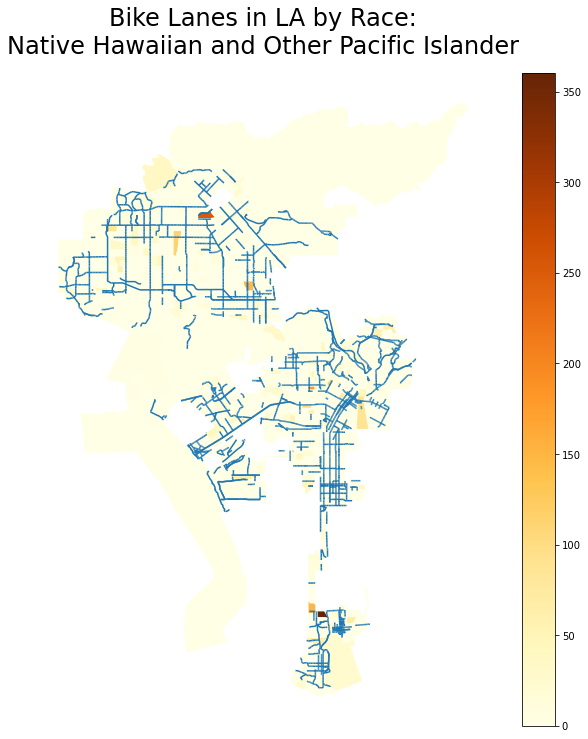

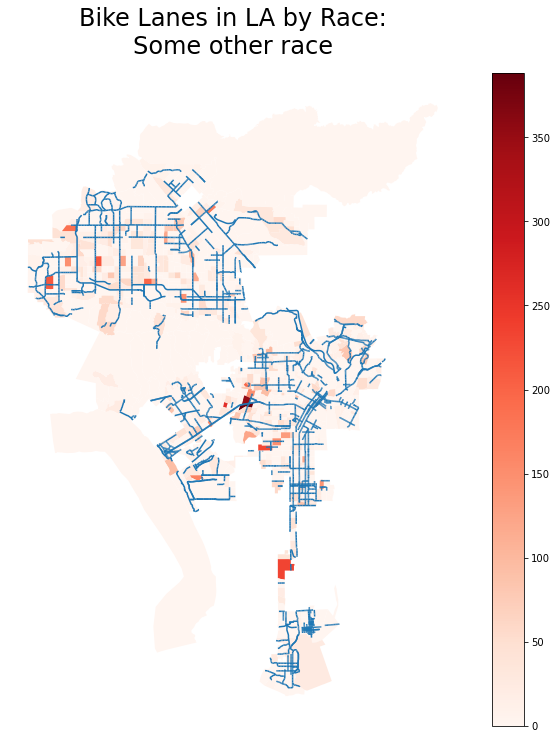

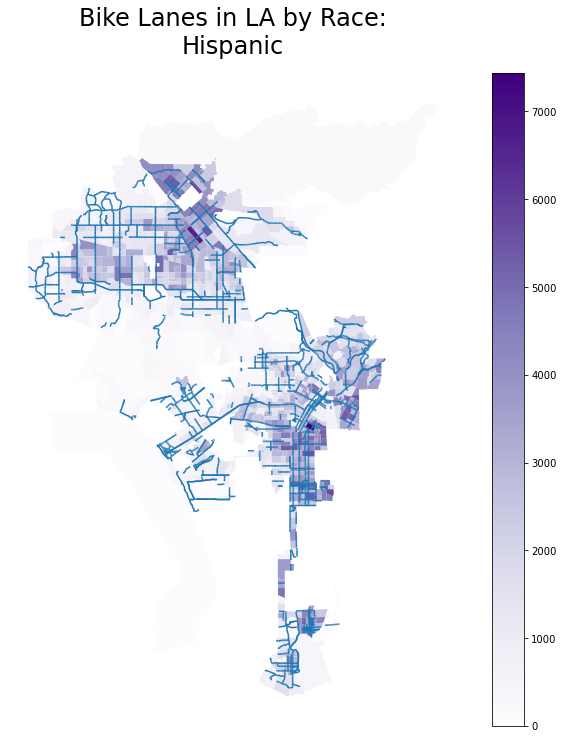

In [99]:
for x, y in zip(race, cmaps): 
    fig,ax = plt.subplots(figsize=(12,12))
        
    census.plot(ax=ax,
            column=x,
            legend=True,
            cmap=y)

    bwy.plot(ax=ax)
    
    ax.axis('off')

    ax.set_title("Bike Lanes in LA by Race:\n" + x ,fontsize=24,pad=20)

## Contributions

* Bailey:
  * Write-up
  * Cleaning Jupyter notebook + reloading bike mapping data and basemaps
  * Socioeconomics: Median household income data + visuals associated with MHI 
  * Presentation
* Monica:
  * Bike collision maps by race
  * Bike collision maps by type and victim descent
  * Plotly Express interactive map 
  * Presentation
